# GIK2KM Data Science & Machine Learning

Dalarna University, VT23

© Joonas Pääkkönen

## Demo: Machine Learning

In this lab we mainly explore some datasets, look for potential correlation and dependencies, and also build some simple prediction models in Sklearn https://scikit-learn.org/stable/

The technique presented here can be extended to other Sklearn ML models and datasets with higher dimensions.

### Exploring the 'Hungarian Chickenpox Cases' Dataset

We import Pandas, download the hungary_chickenpox.csv dataset from
https://archive.ics.uci.edu/ml/datasets/Hungarian+Chickenpox+Cases and save the data into a variable called "chickendata" with the read.csv() method of the Pandas module.

In [2]:
import pandas as pd
chickendata = pd.read_csv('hungary_chickenpox.csv')

In [3]:
type(chickendata)

pandas.core.frame.DataFrame

Abstract: A spatio-temporal dataset of weekly chickenpox cases from Hungary. The dataset consists of a county-level adjacency matrix and time series of the county-level reported cases between 2005 and 2015.

In this demo we ignore the space information and only look at the time series information as in the weekly counts of chickenpox cases.

Attribute Information: Attributes are weekly counts of chickenpox cases in Hungarian counties.

Relevant Papers: "Chickenpox Cases in Hungary: a Benchmark Dataset for Spatiotemporal Signal Processing with Graph Neural Networks," Benedek Rozemberczki, Paul Scherer, Oliver Kiss, Rik Sarkar, Tamas Ferenci

We return column information:

In [4]:
chickendata.columns

Index(['Date', 'BUDAPEST', 'BARANYA', 'BACS', 'BEKES', 'BORSOD', 'CSONGRAD',
       'FEJER', 'GYOR', 'HAJDU', 'HEVES', 'JASZ', 'KOMAROM', 'NOGRAD', 'PEST',
       'SOMOGY', 'SZABOLCS', 'TOLNA', 'VAS', 'VESZPREM', 'ZALA'],
      dtype='object')

In [5]:
chickendata

,Date,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,...,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
0,03/01/2005,168,79,30,173,169,42,136,120,162,...,130,57,2,178,66,64,11,29,87,68
1,10/01/2005,157,60,30,92,200,53,51,70,84,...,80,50,29,141,48,29,58,53,68,26
2,17/01/2005,96,44,31,86,93,30,93,84,191,...,64,46,4,157,33,33,24,18,62,44
3,24/01/2005,163,49,43,126,46,39,52,114,107,...,63,54,14,107,66,50,25,21,43,31
4,31/01/2005,122,78,53,87,103,34,95,131,172,...,61,49,11,124,63,56,7,47,85,60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517,01/12/2014,95,12,41,6,39,0,16,15,14,...,56,7,13,122,4,23,4,11,110,10
518,08/12/2014,43,39,31,10,34,3,2,30,25,...,34,20,18,70,36,5,23,22,63,9
519,15/12/2014,35,7,15,0,0,0,7,7,4,...,30,36,4,72,5,21,14,0,17,10
520,22/12/2014,30,23,8,0,11,4,1,9,10,...,27,17,21,12,5,17,1,1,83,2


Only show the first 10 rows:

In [6]:
chickendata.head(10)

,Date,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,...,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
0,03/01/2005,168,79,30,173,169,42,136,120,162,...,130,57,2,178,66,64,11,29,87,68
1,10/01/2005,157,60,30,92,200,53,51,70,84,...,80,50,29,141,48,29,58,53,68,26
2,17/01/2005,96,44,31,86,93,30,93,84,191,...,64,46,4,157,33,33,24,18,62,44
3,24/01/2005,163,49,43,126,46,39,52,114,107,...,63,54,14,107,66,50,25,21,43,31
4,31/01/2005,122,78,53,87,103,34,95,131,172,...,61,49,11,124,63,56,7,47,85,60
5,07/02/2005,174,76,77,152,189,26,74,181,157,...,95,97,26,146,59,54,27,54,48,60
6,14/02/2005,153,103,54,192,148,65,100,118,129,...,88,56,10,119,104,85,20,32,153,70
7,21/02/2005,115,74,64,174,140,56,111,175,138,...,112,70,21,178,70,75,5,66,149,54
8,28/02/2005,119,86,57,171,90,65,118,105,194,...,67,46,12,112,116,76,22,45,102,42
9,07/03/2005,114,81,129,217,167,64,93,154,119,...,118,73,6,130,68,59,31,85,96,54


The number of rows (observations) and the number of columns (features) is also shown above.

On the website it says (perhaps the mistake 521 is because the indexing starts from 0):

"Number of Instances: 521" <-- number of observations

"Number of Attributes: 20" <-- number of features

We can check this with the "shape" command:

In [7]:
chickendata.shape

(522, 21)

In [8]:
chickendata.size

10962

In [9]:
chickendata.shape[0]*chickendata.shape[1]

10962

We use the Pandas describe() method to describe chickendata.

In [10]:
chickendata.describe()

,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,HEVES,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
count,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000
mean,101.245211,34.204981,37.166667,28.911877,57.082375,31.488506,33.272031,41.436782,47.097701,29.691571,40.869732,25.643678,21.850575,86.101533,27.609195,29.854406,20.352490,22.467433,40.636015,19.873563
std,76.354872,32.567222,36.843095,37.618092,50.725437,33.790208,31.397989,36.014297,44.610836,31.857750,37.283299,24.467995,22.025999,66.773741,26.724236,31.814630,23.273025,25.006638,40.699471,21.999636
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,34.250000,8.000000,8.000000,4.000000,14.250000,6.000000,7.000000,9.000000,11.000000,6.250000,10.000000,6.000000,4.000000,28.250000,6.000000,6.000000,4.000000,3.000000,7.250000,4.000000
50%,93.000000,25.000000,29.500000,14.000000,46.500000,20.500000,24.000000,35.000000,37.000000,21.000000,31.000000,19.000000,15.000000,81.000000,20.500000,18.500000,12.000000,13.000000,32.000000,13.000000
75%,149.000000,51.000000,53.000000,38.750000,83.750000,47.000000,51.750000,63.000000,68.000000,41.000000,61.750000,39.000000,32.750000,129.750000,41.000000,45.000000,29.000000,34.000000,59.000000,31.000000
max,479.000000,194.000000,274.000000,271.000000,355.000000,199.000000,164.000000,181.000000,262.000000,210.000000,224.000000,160.000000,112.000000,431.000000,155.000000,203.000000,131.000000,141.000000,230.000000,216.000000


Use mean, std and var to find sample mean, standard deviation and variance. For example, the mean of the BEKES feature is:

In [11]:
chickendata.BEKES.mean()

28.911877394636015

In [12]:
chickendata.BEKES.var()

1415.1208183496226

In [13]:
import matplotlib.pyplot as plt

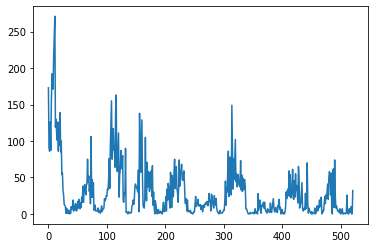

In [14]:
plt.plot(chickendata.BEKES)

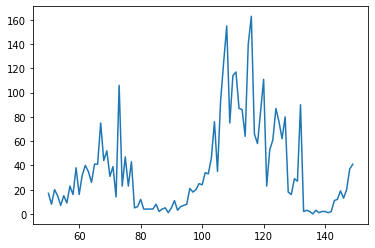

In [15]:
plt.plot(chickendata.BEKES[50:150])

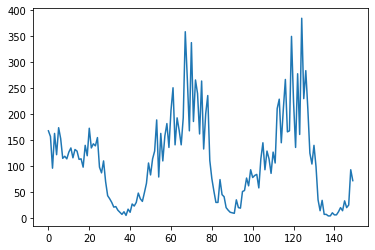

In [16]:
plt.plot(chickendata.BUDAPEST[:150])

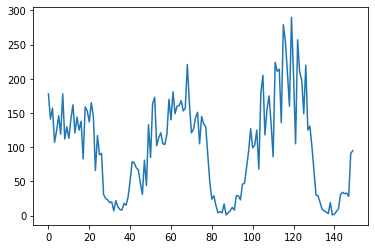

In [17]:
plt.plot(chickendata.PEST[:150])

We use Seaborn to plot the pairplot of the dataset.

https://seaborn.pydata.org/generated/seaborn.pairplot.html

"Plot pairwise relationships in a dataset. By default, this function will create a grid of Axes such that each numeric variable in data will by shared across the y-axes across a single row and the x-axes across a single column. The diagonal plots are treated differently: a univariate distribution plot is drawn to show the marginal distribution of the data in each column."

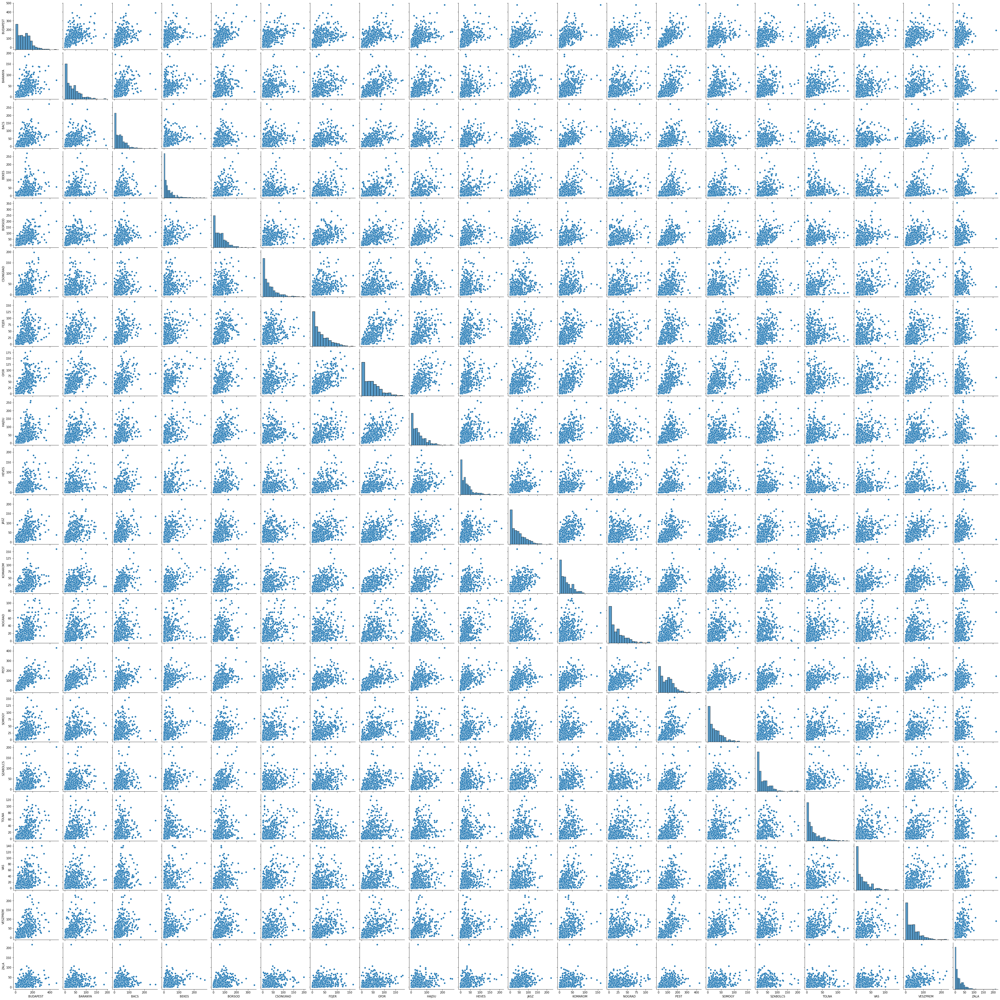

In [18]:
import seaborn as sns
sns.pairplot(chickendata)

In [19]:
chickendata_cases = chickendata.drop(["Date"], axis=1)

In [20]:
chickendata_cases.head(10)

,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,HEVES,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
0,168,79,30,173,169,42,136,120,162,36,130,57,2,178,66,64,11,29,87,68
1,157,60,30,92,200,53,51,70,84,28,80,50,29,141,48,29,58,53,68,26
2,96,44,31,86,93,30,93,84,191,51,64,46,4,157,33,33,24,18,62,44
3,163,49,43,126,46,39,52,114,107,42,63,54,14,107,66,50,25,21,43,31
4,122,78,53,87,103,34,95,131,172,40,61,49,11,124,63,56,7,47,85,60
5,174,76,77,152,189,26,74,181,157,44,95,97,26,146,59,54,27,54,48,60
6,153,103,54,192,148,65,100,118,129,40,88,56,10,119,104,85,20,32,153,70
7,115,74,64,174,140,56,111,175,138,60,112,70,21,178,70,75,5,66,149,54
8,119,86,57,171,90,65,118,105,194,60,67,46,12,112,116,76,22,45,102,42
9,114,81,129,217,167,64,93,154,119,34,118,73,6,130,68,59,31,85,96,54


<AxesSubplot:>

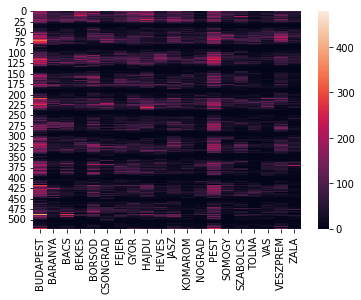

In [21]:
sns.heatmap(chickendata_cases)

In [22]:
correlation = chickendata_cases.corr()

In [23]:
correlation

,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,HEVES,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
BUDAPEST,1.000000,0.592576,0.590591,0.469539,0.647637,0.590576,0.521712,0.642558,0.583234,0.521214,0.588447,0.610660,0.617466,0.765108,0.576550,0.525148,0.570638,0.485438,0.590454,0.482021
BARANYA,0.592576,1.000000,0.549028,0.461681,0.502438,0.466148,0.536788,0.629203,0.558700,0.462026,0.550087,0.588090,0.516305,0.698257,0.523222,0.459277,0.519164,0.362498,0.539627,0.351299
BACS,0.590591,0.549028,1.000000,0.376841,0.497418,0.410252,0.569849,0.629479,0.532840,0.491300,0.556246,0.627695,0.458232,0.588136,0.390666,0.422055,0.354881,0.381002,0.500827,0.338640
BEKES,0.469539,0.461681,0.376841,1.000000,0.520733,0.358816,0.518723,0.622800,0.559992,0.473911,0.593957,0.567197,0.320750,0.506118,0.420621,0.447096,0.263130,0.363584,0.458866,0.443103
BORSOD,0.647637,0.502438,0.497418,0.520733,1.000000,0.450051,0.576000,0.607373,0.606355,0.503052,0.510270,0.524468,0.450783,0.623924,0.528932,0.557510,0.354870,0.437104,0.507951,0.403490
CSONGRAD,0.590576,0.466148,0.410252,0.358816,0.450051,1.000000,0.420919,0.479249,0.412110,0.439871,0.449000,0.422902,0.467342,0.494751,0.459899,0.363813,0.463611,0.516799,0.537751,0.432991
FEJER,0.521712,0.536788,0.569849,0.518723,0.576000,0.420919,1.000000,0.716062,0.583629,0.560054,0.527437,0.550654,0.378492,0.593948,0.498415,0.482961,0.258689,0.304401,0.512440,0.392683
GYOR,0.642558,0.629203,0.629479,0.622800,0.607373,0.479249,0.716062,1.000000,0.671937,0.547099,0.625258,0.700550,0.538613,0.673638,0.560408,0.517038,0.387208,0.479310,0.591379,0.386553
HAJDU,0.583234,0.558700,0.532840,0.559992,0.606355,0.412110,0.583629,0.671937,1.000000,0.499774,0.547277,0.623411,0.382961,0.608544,0.499239,0.508565,0.397388,0.422236,0.451603,0.332356
HEVES,0.521214,0.462026,0.491300,0.473911,0.503052,0.439871,0.560054,0.547099,0.499774,1.000000,0.484403,0.451202,0.578727,0.585709,0.448006,0.401694,0.269817,0.367506,0.396039,0.414694


<AxesSubplot:>

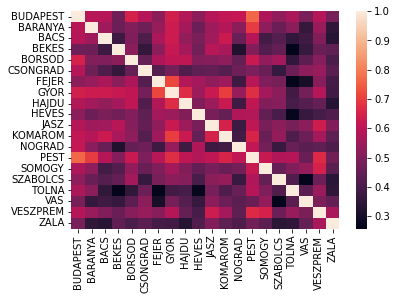

In [24]:
sns.heatmap(correlation)

We can use the scatterplot() method of Seaborn to plot a scatterplot where the x-coordinates are from the BUDAPEST column and the y-coordinates are from the PEST column. We thus plot the cases of BUDAPEST against the cases of PEST.

<AxesSubplot:xlabel='BUDAPEST', ylabel='PEST'>

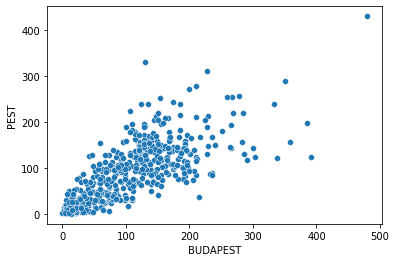

In [25]:
x = chickendata.BUDAPEST
y = chickendata.PEST
sns.scatterplot(x=x,y=y)

We use Scikit-learn to fit a simple linear OLS regression line to the data. We plot the linear regression line alongside the scatterplot.

In [26]:
x

0      168
1      157
2       96
3      163
4      122
      ... 
517     95
518     43
519     35
520     30
521    259
Name: BUDAPEST, Length: 522, dtype: int64

In [27]:
y

0      178
1      141
2      157
3      107
4      124
      ... 
517    122
518     70
519     72
520     12
521    256
Name: PEST, Length: 522, dtype: int64

In [28]:
import numpy as np
from sklearn.linear_model import LinearRegression
x1 = np.array(x)
x2 = x1.reshape(-1, 1)

In [29]:
x1.shape

(522,)

In [30]:
x1

array([168, 157,  96, 163, 122, 174, 153, 115, 119, 114, 127, 135, 116,
       132, 129, 113, 114,  98, 140, 120, 173, 135, 143, 139, 155,  98,
        87, 110,  70,  43,  37,  30,  21,  22,  15,  11,   7,  12,   5,
        17,  11,  27,  23,  30,  48,  37,  32,  49,  67, 106,  83, 114,
       129, 189,  79, 163, 110, 158, 182, 136, 207, 251, 141, 193, 169,
       141, 193, 359, 268, 168, 338, 186, 266, 240, 162, 264, 133, 201,
       236, 111,  76,  52,  30,  30,  74,  45,  41,  20,  15,  11,  10,
         9,  35,  20,  19,  51,  53,  77,  62,  93,  78,  82,  84,  58,
       114, 145,  93, 129, 114,  86, 127, 106, 211, 229, 145, 210, 267,
       166, 168, 350, 224, 136, 278, 161, 385, 230, 284, 210, 125, 104,
       140,  99,  35,  14,  34,   7,   7,   4,   4,  10,   6,   6,  12,
        20,  14,  33,  20,  25,  93,  72,  54, 175, 126,  60, 193,  68,
       183, 156, 479, 143, 193, 105, 136,  91, 150,  82,  64, 100,  95,
       136,  80, 122, 117,  84, 133,  62, 211, 143, 128, 105, 14

In [31]:
x2.shape

(522, 1)

In [32]:
x2

array([[168],
       [157],
       [ 96],
       [163],
       [122],
       [174],
       [153],
       [115],
       [119],
       [114],
       [127],
       [135],
       [116],
       [132],
       [129],
       [113],
       [114],
       [ 98],
       [140],
       [120],
       [173],
       [135],
       [143],
       [139],
       [155],
       [ 98],
       [ 87],
       [110],
       [ 70],
       [ 43],
       [ 37],
       [ 30],
       [ 21],
       [ 22],
       [ 15],
       [ 11],
       [  7],
       [ 12],
       [  5],
       [ 17],
       [ 11],
       [ 27],
       [ 23],
       [ 30],
       [ 48],
       [ 37],
       [ 32],
       [ 49],
       [ 67],
       [106],
       [ 83],
       [114],
       [129],
       [189],
       [ 79],
       [163],
       [110],
       [158],
       [182],
       [136],
       [207],
       [251],
       [141],
       [193],
       [169],
       [141],
       [193],
       [359],
       [268],
       [168],
       [338],
      

## Simple Linear Regression

Simple Linear Regression: relationship between two continuous variables with intercept and slope: https://en.wikipedia.org/wiki/Simple_linear_regression

<AxesSubplot:xlabel='BUDAPEST', ylabel='PEST'>

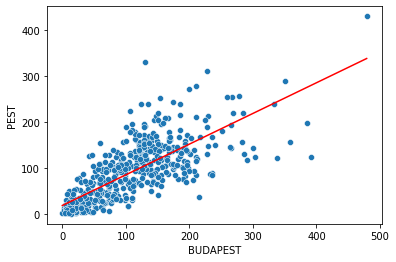

In [33]:
# Remember that originally:
#x = chickendata.BUDAPEST
#y = chickendata.PEST

reg = LinearRegression().fit(x2, y)
y2 = reg.predict(x2)
sns.scatterplot(x=x,y=y)
sns.lineplot(x=x1,y=y2,color="red")

In [34]:
type(reg)

sklearn.linear_model._base.LinearRegression

In [35]:
reg.coef_

array([0.66910146])

In [36]:
reg.coef_

array([0.66910146])

In [37]:
reg.intercept_

18.358214365725843

In [38]:
reg.predict([[0]])[0]

18.358214365725843

In [39]:
reg.predict([[450]])[0]

319.45387085562174

What is the value of the coefficient of determination? Like it says on https://en.wikipedia.org/wiki/Coefficient_of_determination "R squared, is the proportion of the variation in the dependent variable that is predictable from the independent variable", and can be computed as:

In [40]:
reg.score(x2, y)

0.585391001243738

### Polynomial Regression with Various Degrees

We download the DryBeanDataset.zip file from
https://archive.ics.uci.edu/ml/datasets/Dry+Bean+Dataset and save Dry_Bean_Dataset.xlsx to variable "beandata".

In [41]:
from pandas import read_excel
my_sheet = 'Dry_Beans_Dataset'
file_name = 'Dry_Bean_Dataset.xlsx'
beandata = read_excel(file_name, sheet_name = my_sheet)

In [42]:
beandata

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


In [43]:
beandata.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


We use Seaborn to plot the pairplots of the dataset with the hue argument set to the class of the bean. Note that there are several kinds of beans.

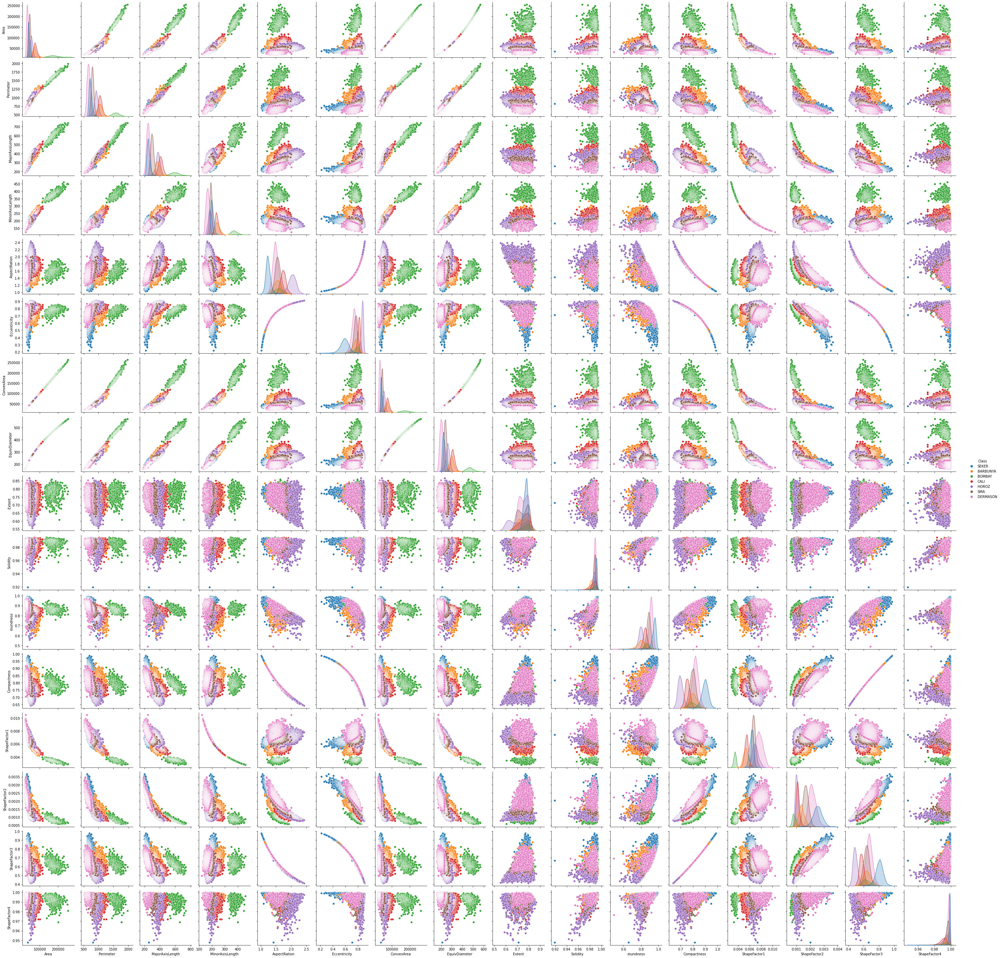

In [44]:
sns.pairplot(beandata, hue="Class")

In [45]:
beandata.columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')

Imagine that you were to use a regression model to predict the Eccentricity feature as the regression target variable with the AspectRation feature as the independent variable. By looking at the corresponding pairplot above, what type of a regression model would you choose?

Let us try polynomials with various degrees.

In [46]:
from sklearn.preprocessing import PolynomialFeatures

In [47]:
X_train = beandata.AspectRation
y_train = beandata.Eccentricity

In [48]:
X_train

0        1.197191
1        1.097356
2        1.209713
3        1.153638
4        1.060798
           ...   
13606    1.552728
13607    1.476439
13608    1.472582
13609    1.489326
13610    1.619841
Name: AspectRation, Length: 13611, dtype: float64

In [49]:
X_train.shape

(13611,)

In [50]:
X_train = np.array(X_train).reshape(-1, 1)

In [51]:
X_train.shape

(13611, 1)

X_train

In [52]:
pft = PolynomialFeatures(degree=10).fit_transform(X_train)

In [53]:
pft.shape

(13611, 11)

In [54]:
pft

array([[  1.        ,   1.19719142,   1.43326731, ...,   4.21996431,
          5.05210508,   6.04833687],
       [  1.        ,   1.09735646,   1.2041912 , ...,   2.10272171,
          2.30743526,   2.53207899],
       [  1.        ,   1.20971266,   1.46340471, ...,   4.58625074,
          5.54804557,   6.71154094],
       ...,
       [  1.        ,   1.47258175,   2.168497  , ...,  22.11237053,
         32.56227322,  47.95060918],
       [  1.        ,   1.48932623,   2.21809261, ...,  24.20575884,
         36.05027151,  53.69061488],
       [  1.        ,   1.61984139,   2.62388614, ...,  47.40017478,
         76.78076519, 124.37266172]])

In [55]:
1.6198**2

2.62375204

In [56]:
y_train

0        0.549812
1        0.411785
2        0.562727
3        0.498616
4        0.333680
           ...   
13606    0.765002
13607    0.735702
13608    0.734065
13609    0.741055
13610    0.786693
Name: Eccentricity, Length: 13611, dtype: float64

In [57]:
y_train = np.array(y_train).reshape(-1, 1)

In [58]:
pft.shape,y_train.shape

((13611, 11), (13611, 1))

In [59]:
reg_poly = LinearRegression().fit(pft, y_train)

Note that here we fit with the whole dataset. To fit with e.g. a random sample of 75% all data points, use this command:

In [60]:
#from sklearn.model_selection import train_test_split
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

In [61]:
y2_poly = reg_poly.predict(pft)

In [62]:
y2_poly

array([[0.54992157],
       [0.41110938],
       [0.56277035],
       ...,
       [0.73410427],
       [0.74107281],
       [0.78665657]])

One way of adding multiple scatter plots to one figure is with a subplot:

In [63]:
x = beandata.AspectRation
y_true = beandata.Eccentricity
y_predicted = y2_poly

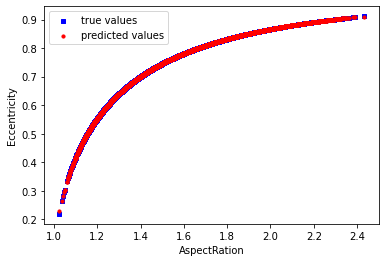

In [64]:
import matplotlib.pyplot as plt

fig = plt.figure()
ax1 = fig.add_subplot(111)

ax1.scatter(x, y_true, s=10, c='b', marker="s", label='true values')
ax1.scatter(x, y_predicted, s=10, c='r', marker="o", label='predicted values')

plt.xlabel('AspectRation')
plt.ylabel('Eccentricity')
plt.legend(loc='upper left')
plt.show()

We can find the training RMSE as follows:

In [65]:
from sklearn.metrics import mean_squared_error
e10 = mean_squared_error(y_true, y_predicted)

In [67]:
e10

1.5067376301333092e-08

## Logistic regression model

We use Scikit-learn to build a logistic regression predictor based on the major axis length of the beans to separate Bombay beans from other beans, and plot the regression curve in the same figure with the corresponding scatterplot.

/opt/homebrew/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

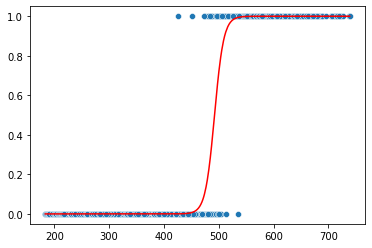

In [68]:
x = beandata['MajorAxisLength'].to_numpy().reshape(-1, 1)
dummy = pd.get_dummies(beandata['Class'].values)
y = dummy['BOMBAY'].values

sns.scatterplot(x=x[:,0],y=y)

from sklearn.linear_model import LogisticRegression
model1 = LogisticRegression().fit(x, y)
yp1 = model1.predict_proba(x)
sns.lineplot(x[:,0],yp1[:,1],color="red")

We evaluate the accuracy of the model with the coefficient of determination of the prediction.

In [69]:
model1.score(model1.predict(x).reshape(-1, 1),y.reshape(-1, 1))

0.9616486665197267

Here we use Scikit-learn to build a Gaussian Naive Bayes (GaussianNB) predictor based on the major axis length of the beans to separate Bombay beans from other beans, and plot the regression curve in the same figure with the corresponding scatterplot.

/opt/homebrew/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

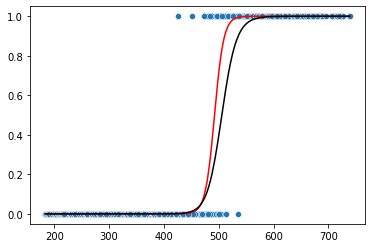

In [70]:
sns.scatterplot(x=x[:,0],y=y)

model1 = LogisticRegression().fit(x, y)
yp1 = model1.predict_proba(x)
sns.lineplot(x[:,0],yp1[:,1],color="red")

from sklearn.naive_bayes import GaussianNB

#model2 = GaussianNB().fit(x, y)
#yp2 = model2.predict_proba(x)
yp2 = GaussianNB().fit(x, y).predict_proba(x)
sns.lineplot(x=x[:,0],y=yp2[:,1],color="black")

In [71]:
model2 = GaussianNB().fit(x, y)
yp2 = model2.predict_proba(x)
print(x)
print(np.unique(y))
print(yp2)

[[208.17811671]
 [200.52479566]
 [212.82612986]
 ...
 [281.53992791]
 [283.38263638]
 [295.14274099]]
[0 1]
[[1.00000000e+00 6.38306370e-13]
 [1.00000000e+00 2.66786556e-13]
 [1.00000000e+00 1.08025692e-12]
 ...
 [9.99999998e-01 1.86614098e-09]
 [9.99999998e-01 2.26014906e-09]
 [9.99999992e-01 7.59641458e-09]]


In [72]:
predict_probas = yp2
true_values_of_y = y

In [73]:
print(min(x), max(x))
print(np.unique(true_values_of_y))
print(min(predict_probas[:,1]), max(predict_probas[:,1]))

[183.601165] [738.86015348]
[0 1]
3.773880373550417e-14 0.9999992215699268


Accuracy of the GaussianNB model:

In [74]:
model2.score(model2.predict(x).reshape(-1, 1),y.reshape(-1, 1))

0.9616486665197267

Number of misclassified beans:

In [75]:
sum(model1.predict(x)!=y)

17

In [76]:
sum(model2.predict(x)!=y)

24